In [ ]:
  !pip install ultralytics torch

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [4]:
import shutil
shutil.copy('/content/drive/MyDrive/Course/Prompt Engineering for Vision Models- deeplearning.ai/Image Segmentation_L2/FastSAM.pt', '/content')

'/content/FastSAM.pt'

### Load the sample image

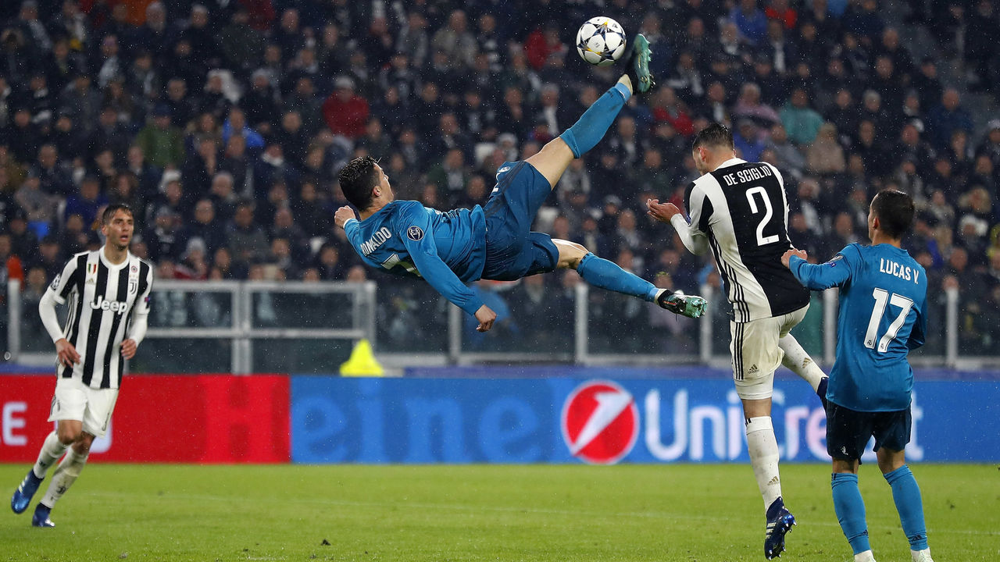

In [5]:
from PIL import Image
raw_image = Image.open("ronaldo-bicycle.jpeg")
raw_image

* Resize the image.

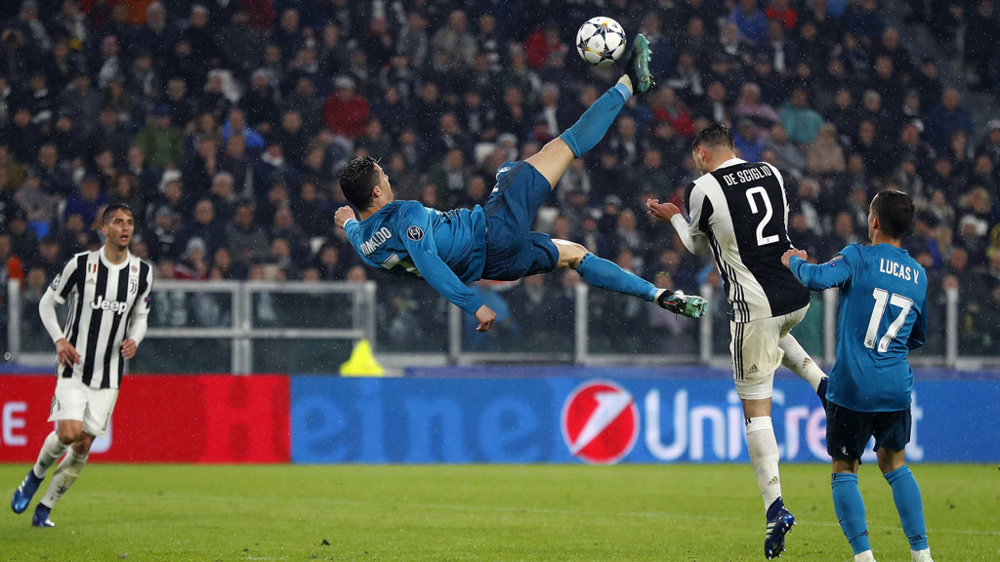

In [6]:
from utils import resize_image #custom function from utils
resized_image = resize_image(raw_image, input_size=1024) #width=1024
resized_image

I will create segmented mask for Cristiano and the ball.

In [7]:
print(resized_image.size) #(w,h)

(1024, 576)


### Import and prepare the model

In [8]:
import torch

In [9]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cpu')

In [10]:
from ultralytics import YOLO
model = YOLO('./FastSAM.pt')

Info about ['FastSAM'](https://docs.ultralytics.com/models/fast-sam/)

### Use the model

First, I am trying only to segment Cristiano Ronaldo

In [22]:
from utils import show_points_on_image  # need to locate the starting points

In [23]:
# Define the coordinates for the point in the image
# [x_axis, y_axis]
input_points = [ [500, 250 ] ]

In [24]:
input_labels = [1] # positive point (which is included in the mask; negative points will be excluded from the mask)

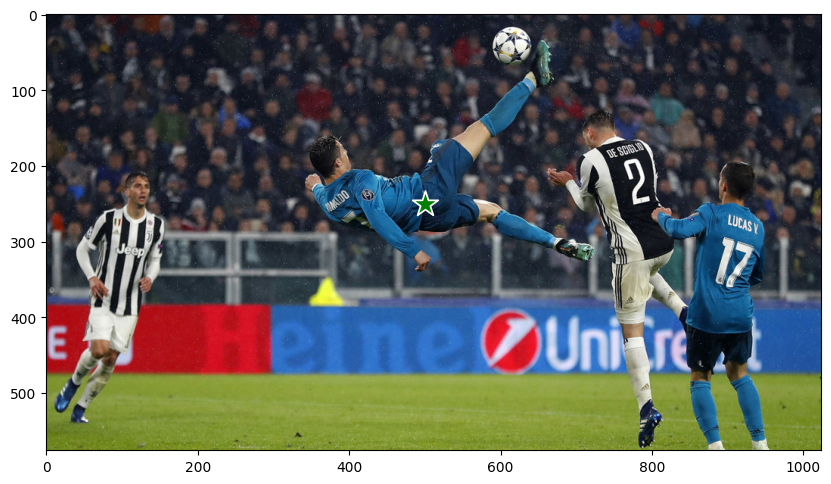

In [25]:
# Function written in the utils file
show_points_on_image(resized_image, input_points)

In [26]:
# Run the model
results = model(resized_image, device=device, retina_masks=True)


0: 576x1024 260 objects, 9964.9ms
Speed: 7.7ms preprocess, 9964.9ms inference, 3334.9ms postprocess per image at shape (1, 3, 576, 1024)


* Filter the mask based on the point defined before.

In [27]:
from utils import format_results, point_prompt

In [28]:
results[0]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: ultralytics.engine.results.Masks object
names: {0: 'object'}
obb: None
orig_img: array([[[ 28,  16,  15],
        [ 27,  15,  13],
        [ 26,  14,  12],
        ...,
        [ 39,  27,  25],
        [ 44,  32,  30],
        [ 35,  23,  21]],

       [[ 28,  16,  15],
        [ 27,  15,  13],
        [ 26,  14,  12],
        ...,
        [ 37,  25,  23],
        [ 42,  30,  28],
        [ 37,  25,  23]],

       [[ 27,  15,  15],
        [ 27,  15,  13],
        [ 27,  15,  13],
        ...,
        [ 40,  28,  26],
        [ 39,  27,  25],
        [ 33,  21,  19]],

       ...,

       [[ 18, 128, 104],
        [ 29, 138, 115],
        [ 32, 140, 117],
        ...,
        [ 25, 129, 108],
        [ 25, 130, 109],
        [ 31, 136, 115]],

       [[  6, 116,  92],
        [ 29, 138, 114],
        [ 33, 141, 118],
        ...,
        [ 28, 132, 111],
   

In [29]:
results = format_results(results[0], filter=0)

In [30]:
# Generate the masks
masks, _ = point_prompt(results, input_points, input_labels)

In [31]:
from utils import show_masks_on_image

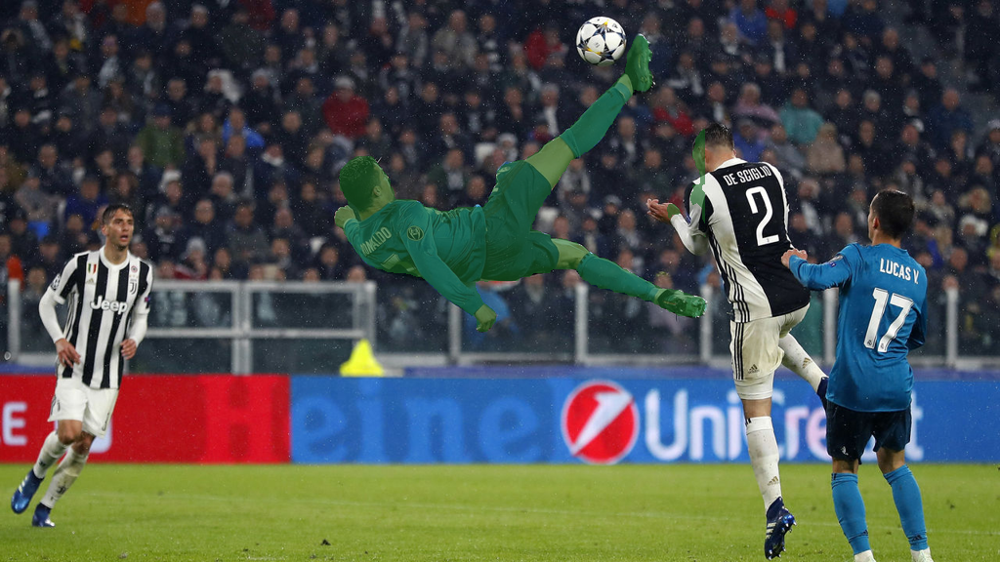

In [33]:
# Visualize the generated masks
show_masks_on_image(resized_image, [masks])

* Define 'semantic masks' - two points to be masked. (CR7 and the ball)

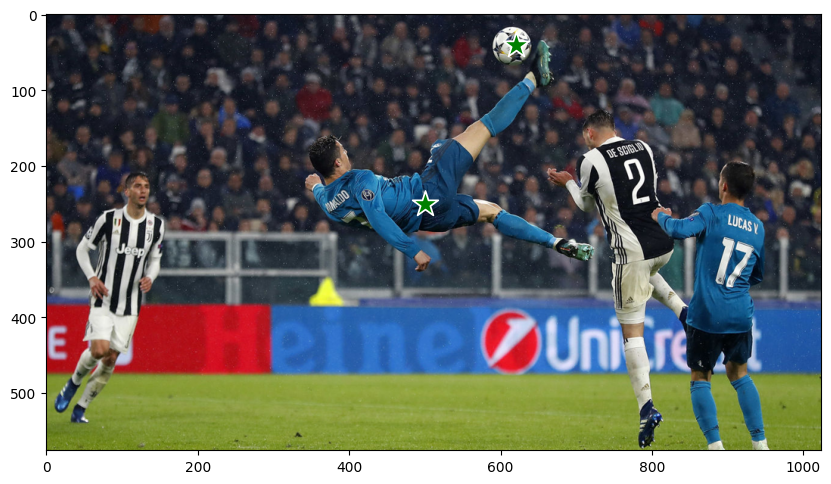

In [100]:
# defining two points
input_points = [[500, 250 ], [620,40]]

# Specify both points as "positive prompt"
input_labels = [1 , 1] # both positive points

# Visualize the points
show_points_on_image(resized_image, input_points)


0: 576x1024 260 objects, 8933.5ms
Speed: 4.0ms preprocess, 8933.5ms inference, 3298.0ms postprocess per image at shape (1, 3, 576, 1024)


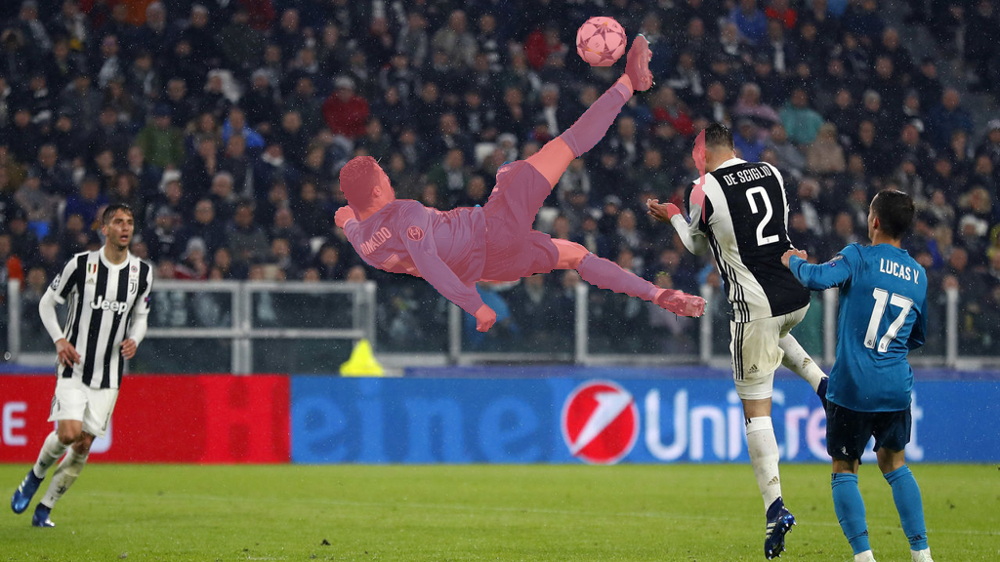

In [101]:
# Run the model
results = model(resized_image, device=device, retina_masks=True)
results = format_results(results[0], 0)

# Generate the masks
masks, _ = point_prompt(results, input_points, input_labels)

# Visualize the generated masks
show_masks_on_image(resized_image, [masks])

We are observing some parts of juventus player(jersey no. 2) in the generated mask, which we do not want.

* Identify subsections of the image by adding a **negative prompt**.

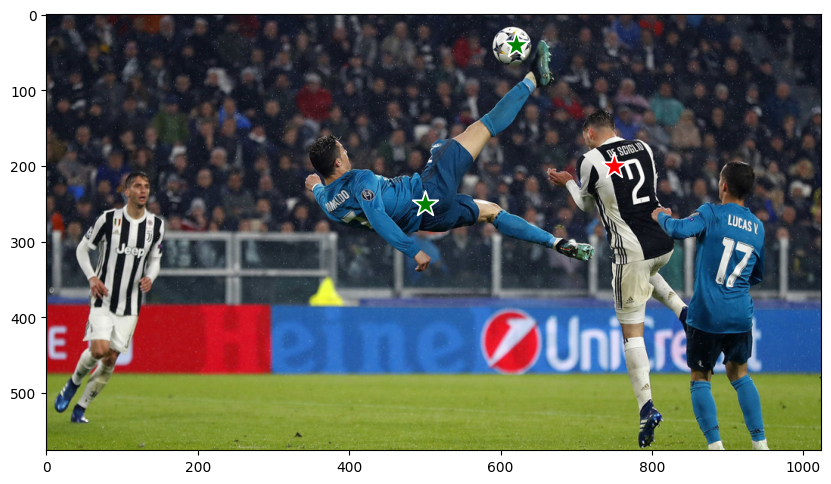

In [102]:
# trying to exclude the part of juventus player(jersey no. 2) from the generated mask

# defining three points
input_points = [ [500, 250 ], [620,40], [750,200]]

input_labels = [1, 1, 0] # positive prompt, postive prompt, negative prompt(for exclusion)

# Visualize the points defined before
show_points_on_image(resized_image, input_points, input_labels)

Note: From the image above, the red star indicates the negative prompt and the green star the positive prompt.


0: 576x1024 260 objects, 9219.1ms
Speed: 3.5ms preprocess, 9219.1ms inference, 3037.0ms postprocess per image at shape (1, 3, 576, 1024)


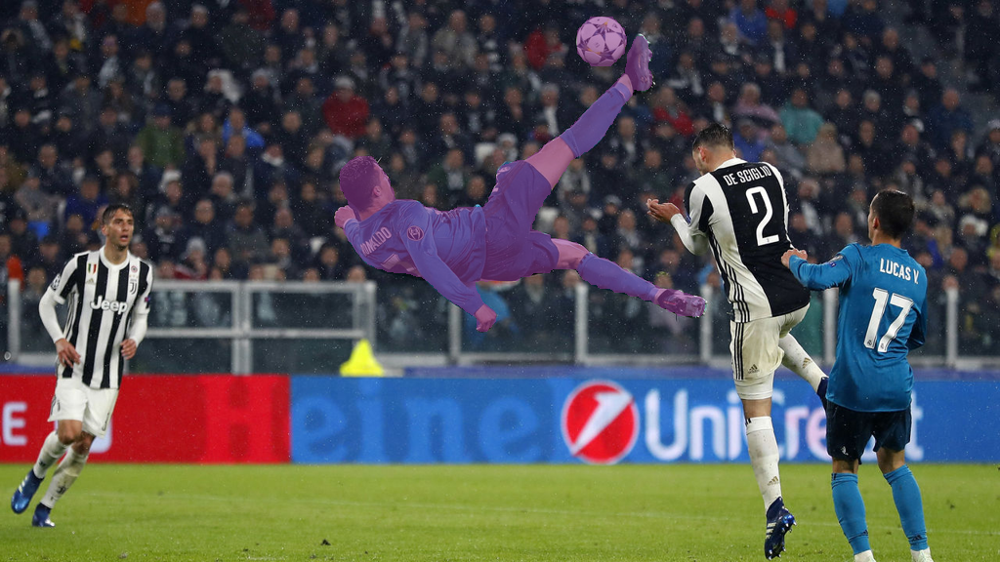

In [103]:
# Run the model
results = model(resized_image, device=device, retina_masks=True)
results = format_results(results[0], 0)

# Generate the masks
masks, _ = point_prompt(results, input_points, input_labels)

# Visualize the generated masks
show_masks_on_image(resized_image, [masks])

Perfect!

### Prompting with bounding boxes

In [35]:
from utils import box_prompt, show_boxes_on_image, show_masks_on_image

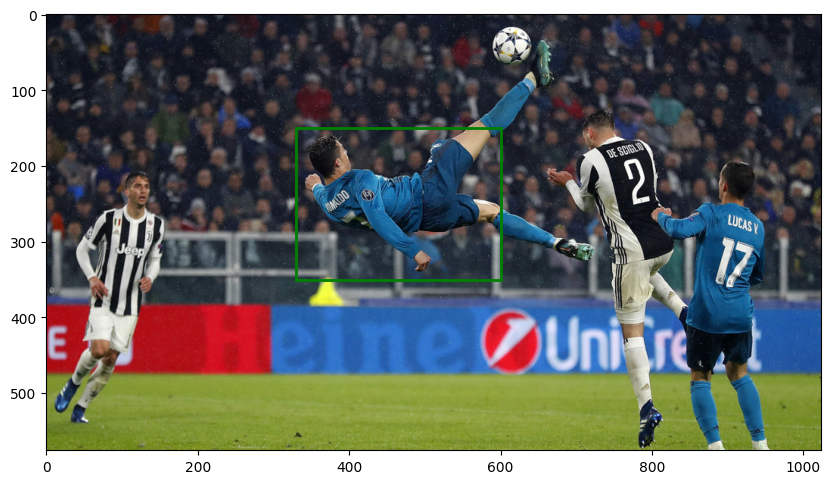

In [41]:
# Set the coordinates for the box

# [xmin, ymin, xmax, ymax]
input_boxes = [330, 150, 600, 350]

# Visualize the bounding box defined with the coordinates above
show_boxes_on_image(resized_image, [input_boxes])

* Now, try to isolate the mask from the total output of the model.

In [42]:
results = model(resized_image, device=device, retina_masks=True)

#Generate the masks
masks = results[0].masks.data
masks


0: 576x1024 260 objects, 10576.4ms
Speed: 10.8ms preprocess, 10576.4ms inference, 3658.3ms postprocess per image at shape (1, 3, 576, 1024)


tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0.,  ..., 0., 0., 0.],
         ...,
         [0., 0., 0.,  ..., 0., 0., 0.],
         [0., 0., 0., 

In [43]:
# Convert to True/False booleans
masks = masks > 0

In [45]:
masks

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [

In [44]:
masks.shape

torch.Size([260, 576, 1024])

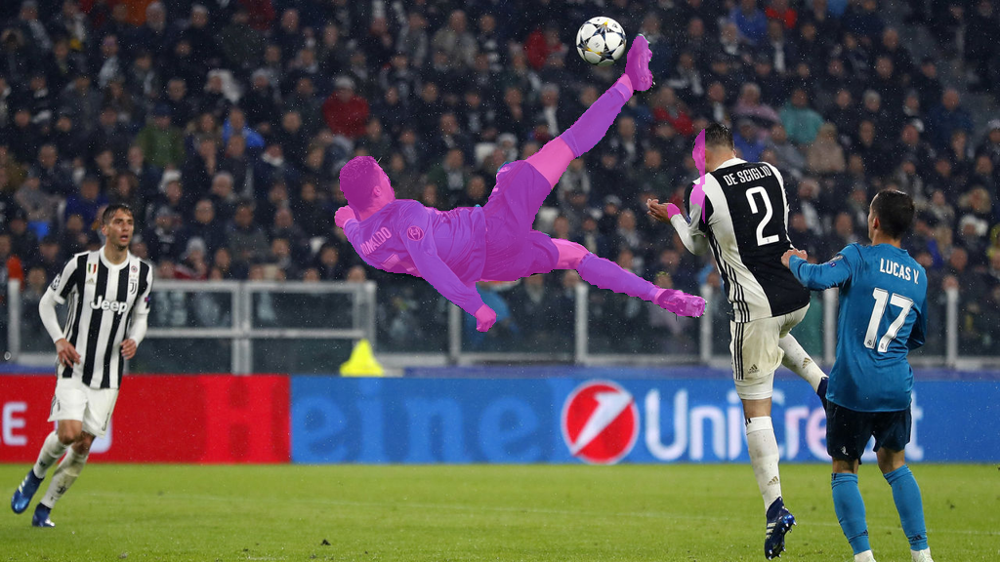

In [46]:
masks, _ = box_prompt(masks, input_boxes)

# Visualize the masks
show_masks_on_image(resized_image, [masks])

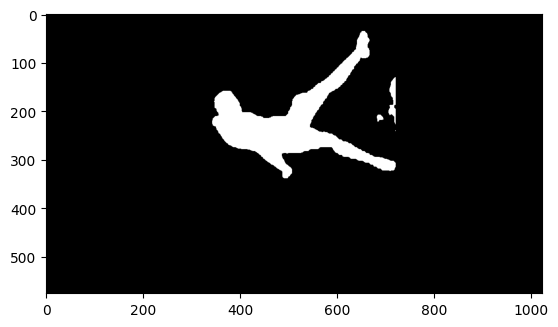

In [47]:
from matplotlib import pyplot as plt

# Plot the binary mask as an image
plt.imshow(masks, cmap='gray')